In [5]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [6]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [7]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [8]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in PCC feature selection method
feature_names = ['Root10DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot10DaysSeedling', 'Shoot35DaysSeedling', 'Root35DaysSeedling', 
                 'Leaf21DaysSeedling', 'Root14DaysSeedling', 'Shoot3DaysSeedling', 'Root24DaysSeedling', 'Root52DaysSeedling', 
                 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot14DaysSeedling', 'Shoot21DaysSeedling', 'Shoot17DaysSeedling',
                  'ET', 'PCC', 'log_2FoldChange', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X_fs.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

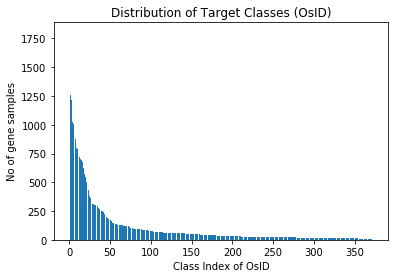

In [9]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [10]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [11]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [12]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [13]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=60, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1
Fold: 1
Epoch 1/60
1834/1834 [==============================] - 4s 2ms/step - loss: 4.4315 - accuracy: 0.1034 - val_loss: 4.0467 - val_accuracy: 0.1027
Epoch 2/60
1834/1834 [==============================] - 3s 2ms/step - loss: 3.7067 - accuracy: 0.1829 - val_loss: 3.7063 - val_accuracy: 0.2354
Epoch 3/60
1834/1834 [==============================] - 3s 2ms/step - loss: 3.3566 - accuracy: 0.2406 - val_loss: 3.4047 - val_accuracy: 0.2690
Epoch 4/60
1834/1834 [==============================] - 3s 2ms/step - loss: 3.0825 - accuracy: 0.2744 - val_loss: 3.1963 - val_accuracy: 0.2735
Epoch 5/60
1834/1834 [==============================] - 3s 2ms/step - loss: 2.8747 - accuracy: 0.2987 - val_loss: 3.0377 - val_accuracy: 0.2841
Epoch 6/60
1834/1834 [==============================] - 3s 2ms/step - loss: 2.7114 - accuracy: 0.3338 - val_loss: 2.9598 - val_accuracy: 0.3009
Epoch 7/60
1834/1834 [==============================] - 3s 2ms/step - loss: 2.5753 - accuracy: 0.361

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


1834/1834 [==============================] - 4s 2ms/step - loss: 4.1256 - accuracy: 0.1784 - val_loss: 3.4881 - val_accuracy: 0.2620
Epoch 2/60
1834/1834 [==============================] - 3s 2ms/step - loss: 2.7753 - accuracy: 0.4114 - val_loss: 2.5268 - val_accuracy: 0.4978
Epoch 3/60
1834/1834 [==============================] - 3s 2ms/step - loss: 1.9491 - accuracy: 0.5430 - val_loss: 1.8994 - val_accuracy: 0.5861
Epoch 4/60
1834/1834 [==============================] - 3s 2ms/step - loss: 1.4935 - accuracy: 0.6281 - val_loss: 1.6281 - val_accuracy: 0.6459
Epoch 5/60
1834/1834 [==============================] - 3s 2ms/step - loss: 1.2713 - accuracy: 0.6731 - val_loss: 1.4325 - val_accuracy: 0.6718
Epoch 6/60
1834/1834 [==============================] - 3s 2ms/step - loss: 1.1381 - accuracy: 0.6996 - val_loss: 1.3572 - val_accuracy: 0.6592
Epoch 7/60
1834/1834 [==============================] - 3s 2ms/step - loss: 1.0445 - accuracy: 0.7219 - val_loss: 1.2726 - val_accuracy: 0.7219
Epo

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 14s 4ms/step - loss: 3.8519 - accuracy: 0.2598 - val_loss: 3.0020 - val_accuracy: 0.4300
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 2.2586 - accuracy: 0.5514 - val_loss: 2.0764 - val_accuracy: 0.6158
Epoch 3/60
1834/1834 [==============================] - 6s 4ms/step - loss: 1.5665 - accuracy: 0.6486 - val_loss: 1.6139 - val_accuracy: 0.6898
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1985 - accuracy: 0.7128 - val_loss: 1.3653 - val_accuracy: 0.7310
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.0039 - accuracy: 0.7470 - val_loss: 1.2471 - val_accuracy: 0.7307
Epoch 6/60
1834/1834 [==============================] - 6s 4ms/step - loss: 0.8919 - accuracy: 0.7686 - val_loss: 1.1677 - val_accuracy: 0.7799
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8144 - accuracy: 0.7801 - val_loss: 1.0752 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 14s 4ms/step - loss: 3.5312 - accuracy: 0.3390 - val_loss: 2.5245 - val_accuracy: 0.5591
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.7702 - accuracy: 0.6634 - val_loss: 1.5674 - val_accuracy: 0.7192
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.0886 - accuracy: 0.7738 - val_loss: 1.1355 - val_accuracy: 0.7823
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7919 - accuracy: 0.8175 - val_loss: 0.9380 - val_accuracy: 0.8069
Epoch 5/60
1834/1834 [==============================] - 6s 4ms/step - loss: 0.6470 - accuracy: 0.8425 - val_loss: 0.8357 - val_accuracy: 0.8297
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5612 - accuracy: 0.8536 - val_loss: 0.7468 - val_accuracy: 0.8430
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5025 - accuracy: 0.8654 - val_loss: 0.6936 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 4ms/step - loss: 3.6715 - accuracy: 0.3329 - val_loss: 2.7341 - val_accuracy: 0.5323
Epoch 2/60
1834/1834 [==============================] - 8s 4ms/step - loss: 2.0228 - accuracy: 0.6210 - val_loss: 1.8232 - val_accuracy: 0.6721
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.2871 - accuracy: 0.7454 - val_loss: 1.2965 - val_accuracy: 0.7841
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8712 - accuracy: 0.8136 - val_loss: 1.0364 - val_accuracy: 0.8113
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6559 - accuracy: 0.8499 - val_loss: 0.8344 - val_accuracy: 0.8503
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5385 - accuracy: 0.8723 - val_loss: 0.7283 - val_accuracy: 0.8663
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4623 - accuracy: 0.8856 - val_loss: 0.6710 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 15s 4ms/step - loss: 3.6651 - accuracy: 0.3263 - val_loss: 2.4968 - val_accuracy: 0.5959
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6400 - accuracy: 0.7016 - val_loss: 1.3554 - val_accuracy: 0.7555
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8740 - accuracy: 0.8252 - val_loss: 0.9347 - val_accuracy: 0.8406
Epoch 4/60
1834/1834 [==============================] - 6s 4ms/step - loss: 0.5599 - accuracy: 0.8783 - val_loss: 0.7090 - val_accuracy: 0.8837
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4169 - accuracy: 0.9055 - val_loss: 0.5709 - val_accuracy: 0.9165
Epoch 6/60
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3406 - accuracy: 0.9158 - val_loss: 0.5091 - val_accuracy: 0.9256
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2966 - accuracy: 0.9273 - val_loss: 0.5137 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 4ms/step - loss: 3.3870 - accuracy: 0.3847 - val_loss: 2.1637 - val_accuracy: 0.6185
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3734 - accuracy: 0.7501 - val_loss: 1.2489 - val_accuracy: 0.7686
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7973 - accuracy: 0.8333 - val_loss: 0.9041 - val_accuracy: 0.8288
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5680 - accuracy: 0.8682 - val_loss: 0.7471 - val_accuracy: 0.8698
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4425 - accuracy: 0.8940 - val_loss: 0.6503 - val_accuracy: 0.8851
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3726 - accuracy: 0.9095 - val_loss: 0.5671 - val_accuracy: 0.8926
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3207 - accuracy: 0.9200 - val_loss: 0.5211 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 5ms/step - loss: 3.4934 - accuracy: 0.3642 - val_loss: 2.3403 - val_accuracy: 0.6242
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4612 - accuracy: 0.7311 - val_loss: 1.2874 - val_accuracy: 0.7810
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7737 - accuracy: 0.8479 - val_loss: 0.9333 - val_accuracy: 0.8339
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5046 - accuracy: 0.8908 - val_loss: 0.7466 - val_accuracy: 0.8612
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3807 - accuracy: 0.9121 - val_loss: 0.6133 - val_accuracy: 0.9043
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3132 - accuracy: 0.9244 - val_loss: 0.5361 - val_accuracy: 0.9263
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2740 - accuracy: 0.9332 - val_loss: 0.5335 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 12s 4ms/step - loss: 3.4383 - accuracy: 0.3639 - val_loss: 2.3104 - val_accuracy: 0.5682
Epoch 2/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4557 - accuracy: 0.7333 - val_loss: 1.2927 - val_accuracy: 0.7814
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7786 - accuracy: 0.8406 - val_loss: 0.8893 - val_accuracy: 0.8341
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5344 - accuracy: 0.8771 - val_loss: 0.7132 - val_accuracy: 0.8784
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4142 - accuracy: 0.9031 - val_loss: 0.6252 - val_accuracy: 0.8946
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3413 - accuracy: 0.9157 - val_loss: 0.5472 - val_accuracy: 0.9203
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3046 - accuracy: 0.9240 - val_loss: 0.5616 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 12s 4ms/step - loss: 3.5387 - accuracy: 0.3524 - val_loss: 2.2606 - val_accuracy: 0.6337
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4240 - accuracy: 0.7405 - val_loss: 1.2364 - val_accuracy: 0.7943
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7420 - accuracy: 0.8535 - val_loss: 0.8025 - val_accuracy: 0.8729
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4696 - accuracy: 0.8972 - val_loss: 0.6363 - val_accuracy: 0.8970
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3452 - accuracy: 0.9225 - val_loss: 0.5261 - val_accuracy: 0.9130
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2816 - accuracy: 0.9332 - val_loss: 0.4780 - val_accuracy: 0.9223
Epoch 7/60
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2420 - accuracy: 0.9439 - val_loss: 0.4483 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 4ms/step - loss: 3.3734 - accuracy: 0.3823 - val_loss: 2.1106 - val_accuracy: 0.6554
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3134 - accuracy: 0.7601 - val_loss: 1.2013 - val_accuracy: 0.8025
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7350 - accuracy: 0.8491 - val_loss: 0.8737 - val_accuracy: 0.8508
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5145 - accuracy: 0.8840 - val_loss: 0.6995 - val_accuracy: 0.8855
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3972 - accuracy: 0.9078 - val_loss: 0.5969 - val_accuracy: 0.8968
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3231 - accuracy: 0.9191 - val_loss: 0.5384 - val_accuracy: 0.9048
Epoch 7/60
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2800 - accuracy: 0.9293 - val_loss: 0.4586 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 12s 4ms/step - loss: 3.4838 - accuracy: 0.3839 - val_loss: 2.2981 - val_accuracy: 0.5979
Epoch 2/60
1834/1834 [==============================] - 6s 4ms/step - loss: 1.4996 - accuracy: 0.7220 - val_loss: 1.3499 - val_accuracy: 0.7795
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8624 - accuracy: 0.8272 - val_loss: 0.9903 - val_accuracy: 0.8324
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5661 - accuracy: 0.8807 - val_loss: 0.7836 - val_accuracy: 0.8773
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4216 - accuracy: 0.9064 - val_loss: 0.6466 - val_accuracy: 0.9123
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3421 - accuracy: 0.9186 - val_loss: 0.5862 - val_accuracy: 0.9103
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2948 - accuracy: 0.9308 - val_loss: 0.5343 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 12s 5ms/step - loss: 3.3704 - accuracy: 0.3834 - val_loss: 2.1909 - val_accuracy: 0.6027
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3870 - accuracy: 0.7510 - val_loss: 1.2367 - val_accuracy: 0.7996
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7556 - accuracy: 0.8554 - val_loss: 0.8844 - val_accuracy: 0.8536
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4946 - accuracy: 0.8942 - val_loss: 0.7493 - val_accuracy: 0.8627
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3777 - accuracy: 0.9140 - val_loss: 0.5627 - val_accuracy: 0.9105
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3084 - accuracy: 0.9267 - val_loss: 0.5048 - val_accuracy: 0.9110
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2718 - accuracy: 0.9320 - val_loss: 0.4992 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 4ms/step - loss: 3.5595 - accuracy: 0.3430 - val_loss: 2.4427 - val_accuracy: 0.5653
Epoch 2/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.5863 - accuracy: 0.7072 - val_loss: 1.3708 - val_accuracy: 0.7821
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8480 - accuracy: 0.8362 - val_loss: 0.9796 - val_accuracy: 0.8406
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5396 - accuracy: 0.8837 - val_loss: 0.7168 - val_accuracy: 0.8623
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3956 - accuracy: 0.9048 - val_loss: 0.5827 - val_accuracy: 0.8908
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3246 - accuracy: 0.9188 - val_loss: 0.5293 - val_accuracy: 0.9114
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2780 - accuracy: 0.9289 - val_loss: 0.4545 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.3513 - accuracy: 0.4021 - val_loss: 2.1859 - val_accuracy: 0.6373
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3915 - accuracy: 0.7395 - val_loss: 1.2534 - val_accuracy: 0.7826
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7851 - accuracy: 0.8395 - val_loss: 0.8679 - val_accuracy: 0.8558
Epoch 4/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5325 - accuracy: 0.8801 - val_loss: 0.6879 - val_accuracy: 0.8594
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4101 - accuracy: 0.9042 - val_loss: 0.5756 - val_accuracy: 0.8899
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3418 - accuracy: 0.9120 - val_loss: 0.5740 - val_accuracy: 0.8984
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2938 - accuracy: 0.9276 - val_loss: 0.4744 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 13s 4ms/step - loss: 3.1632 - accuracy: 0.4031 - val_loss: 1.9262 - val_accuracy: 0.6667
Epoch 2/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.2024 - accuracy: 0.7705 - val_loss: 1.0571 - val_accuracy: 0.8246
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6484 - accuracy: 0.8588 - val_loss: 0.9723 - val_accuracy: 0.8027
Epoch 4/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4213 - accuracy: 0.9033 - val_loss: 0.6450 - val_accuracy: 0.8875
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3274 - accuracy: 0.9194 - val_loss: 0.5382 - val_accuracy: 0.9032
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2781 - accuracy: 0.9316 - val_loss: 0.4983 - val_accuracy: 0.9161
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2431 - accuracy: 0.9369 - val_loss: 0.4228 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 14s 5ms/step - loss: 3.1970 - accuracy: 0.3938 - val_loss: 2.0163 - val_accuracy: 0.6592
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.2465 - accuracy: 0.7752 - val_loss: 1.1341 - val_accuracy: 0.8215
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6761 - accuracy: 0.8633 - val_loss: 0.8246 - val_accuracy: 0.8804
Epoch 4/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4449 - accuracy: 0.9012 - val_loss: 0.6709 - val_accuracy: 0.9032
Epoch 5/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3282 - accuracy: 0.9234 - val_loss: 0.6020 - val_accuracy: 0.9023
Epoch 6/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.2622 - accuracy: 0.9377 - val_loss: 0.5675 - val_accuracy: 0.9221
Epoch 7/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.2336 - accuracy: 0.9420 - val_loss: 0.4486 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5220 - accuracy: 0.3318 - val_loss: 2.3960 - val_accuracy: 0.5802
Epoch 2/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.5762 - accuracy: 0.7152 - val_loss: 1.3667 - val_accuracy: 0.7699
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9040 - accuracy: 0.8282 - val_loss: 0.9392 - val_accuracy: 0.8423
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5837 - accuracy: 0.8788 - val_loss: 0.8053 - val_accuracy: 0.8716
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4171 - accuracy: 0.9108 - val_loss: 0.6624 - val_accuracy: 0.8966
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3211 - accuracy: 0.9252 - val_loss: 0.5848 - val_accuracy: 0.9081
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2719 - accuracy: 0.9336 - val_loss: 0.4939 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 15s 5ms/step - loss: 3.4223 - accuracy: 0.3737 - val_loss: 2.1688 - val_accuracy: 0.6054
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4224 - accuracy: 0.7356 - val_loss: 1.2514 - val_accuracy: 0.7845
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7877 - accuracy: 0.8477 - val_loss: 0.9015 - val_accuracy: 0.8563
Epoch 4/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5053 - accuracy: 0.8955 - val_loss: 0.7135 - val_accuracy: 0.8899
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3617 - accuracy: 0.9201 - val_loss: 0.5938 - val_accuracy: 0.9143
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2832 - accuracy: 0.9352 - val_loss: 0.5173 - val_accuracy: 0.9245
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2411 - accuracy: 0.9421 - val_loss: 0.4742 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4985 - accuracy: 0.3360 - val_loss: 2.2172 - val_accuracy: 0.5917
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4330 - accuracy: 0.7371 - val_loss: 1.2506 - val_accuracy: 0.7830
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7933 - accuracy: 0.8432 - val_loss: 0.8650 - val_accuracy: 0.8519
Epoch 4/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5035 - accuracy: 0.8964 - val_loss: 0.6746 - val_accuracy: 0.8904
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3558 - accuracy: 0.9220 - val_loss: 0.5976 - val_accuracy: 0.8906
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2748 - accuracy: 0.9351 - val_loss: 0.4675 - val_accuracy: 0.9280
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2320 - accuracy: 0.9459 - val_loss: 0.4335 - val_accuracy

In [14]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

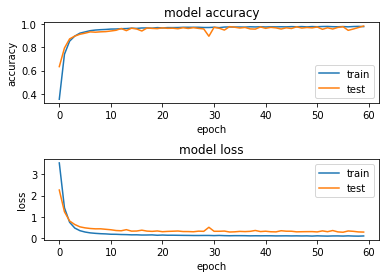

Final Test Accuracy: 0.9861428737640381


In [15]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [16]:
#Select only the optimal number of input features for X_test
X_test = X_test[:,:(best_model_index+1)]

# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


424/424 [==============================] - 2s 3ms/step
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       591
           1       1.00      1.00      1.00       430
           2       1.00      1.00      1.00       419
           3       1.00      1.00      1.00       384
           4       1.00      1.00      1.00       339
           5       1.00      1.00      1.00       342
           6       1.00      1.00      1.00       310
           7       1.00      1.00      1.00       325
           8       1.00      1.00      1.00       294
           9       1.00      1.00      1.00       269
          10       1.00      1.00      1.00       296
          11       1.00      1.00      1.00       258
          12       1.00      1.00      1.00       247
          13       1.00      1.00      1.00       237
          14       0.97      1.00      0.99       239
          15       1.00      1.00      1.00       235
  

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [17]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         331              100       False
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
